## Forest Fire Prediction Task

-----------------------

Novie Chiuman, Batch 8

-----------------------

Task: Predict the probability of forest fire given historical data.
      
Specific for this task, we'll be using classification model.


### Import Functions and Dataset

In [1]:
#Import functions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt #graphic
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

plt.style.use('seaborn')

In [2]:
#Attribute information
with open("forestfires.names", encoding = "ISO-8859-1") as f:
    print(f.read())

Attribute information:

   For more information, read [Cortez and Morais, 2007].

   1. X - x-axis spatial coordinate within the Montesinho park map: 1 to 9
   2. Y - y-axis spatial coordinate within the Montesinho park map: 2 to 9
   3. month - month of the year: "jan" to "dec" 
   4. day - day of the week: "mon" to "sun"
   5. FFMC - FFMC index from the FWI system: 18.7 to 96.20
   6. DMC - DMC index from the FWI system: 1.1 to 291.3 
   7. DC - DC index from the FWI system: 7.9 to 860.6 
   8. ISI - ISI index from the FWI system: 0.0 to 56.10
   9. temp - temperature in Celsius degrees: 2.2 to 33.30
   10. RH - relative humidity in %: 15.0 to 100
   11. wind - wind speed in km/h: 0.40 to 9.40 
   12. rain - outside rain in mm/m2 : 0.0 to 6.4 
   13. area - the burned area of the forest (in ha): 0.00 to 1090.84 
   (this output variable is very skewed towards 0.0, thus it may make
    sense to model with the logarithm transform). 


In [3]:
#Import CSV
df_ff = pd.read_csv('forestfires.csv')
df_ff.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


### Exploratory Data Analysis

In [4]:
#Check for nulls
#sum() is done twice to get total rows with null values from all columns/features
df_ff.isna().sum().sum()

0

In [5]:
from pandas_profiling import ProfileReport
prof = ProfileReport(df_ff)
prof

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the report generated above, we discovered that: 
1. DC and DMC are highly correlated to each other (positive correlation).
2. Many features are highly skewed. FFMC is left skewed, whilst ISI and rain are right skewed.
3. Area, which is the target, is also highly skewed at 0.

Let's plot the skewed features.

In [6]:
#Skew and kurtosis
print("Skew: \n{}".format(df_ff.skew()))
print("Kurtosis: \n{}".format(df_ff.kurtosis()))

Skew: 
X        0.036246
Y        0.417296
FFMC    -6.575606
DMC      0.547498
DC      -1.100445
ISI      2.536325
temp    -0.331172
RH       0.862904
wind     0.571001
rain    19.816344
area    12.846934
dtype: float64
Kurtosis: 
X        -1.172331
Y         1.420553
FFMC     67.066041
DMC       0.204822
DC       -0.245244
ISI      21.458037
temp      0.136166
RH        0.438183
wind      0.054324
rain    421.295964
area    194.140721
dtype: float64


- If skewness is less than −1 or greater than +1, the distribution is highly skewed.
- If skewness is between −1 and −½ or between +½ and +1, the distribution is moderately skewed.
- If skewness is between −½ and +½, the distribution is approximately symmetric.

- A normal distribution has kurtosis exactly 3 (excess kurtosis exactly 0). Any distribution with kurtosis ≈3 (excess ≈0) is called mesokurtic.
- A distribution with kurtosis <3 (excess kurtosis <0 ) is called platykurtic. Compared to a normal distribution, its tails are shorter and thinner, and often its central peak is lower and broader.
- A distribution with kurtosis >3 (excess kurtosis >0) is called leptokurtic. Compared to a normal distribution, its tails are longer and fatter, and often its central peak is higher and sharper.

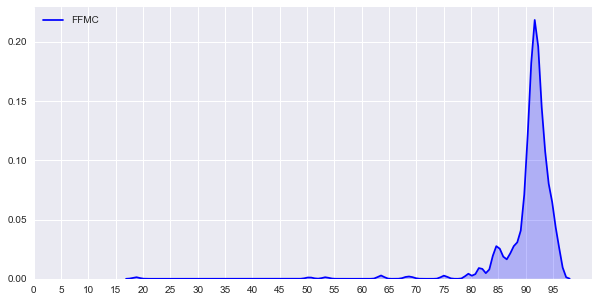

In [7]:
#plot FFMC
plt.figure(figsize=(10,5))
ax = sns.kdeplot(df_ff['FFMC'],shade=True,color='b')
plt.xticks([i for i in range(0,100,5)])
plt.show()

FFMC is right skewed.

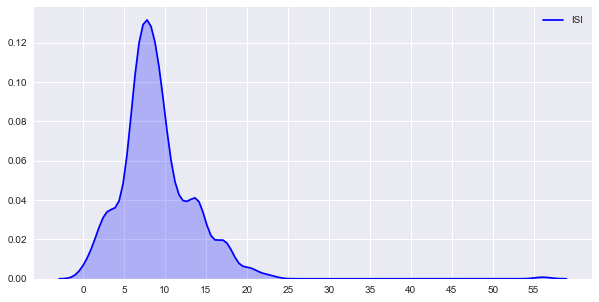

In [8]:
#plot ISI
plt.figure(figsize=(10,5))
ax = sns.kdeplot(df_ff['ISI'],shade=True,color='b')
plt.xticks([i for i in range(0,60,5)])
plt.show()
#ISI is right skewed

ISI is left skewed.

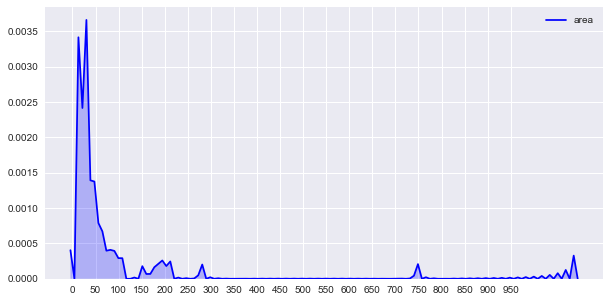

In [9]:
#plot area
plt.figure(figsize=(10,5))
ax = sns.kdeplot(df_ff['area'],shade=True,color='b')
plt.xticks([i for i in range(0,1000,50)])
plt.show()

Area is highly skewed. As this is our target, this might indicate data imbalance.

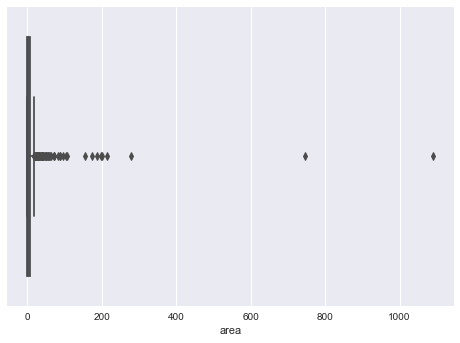

In [10]:
ax = sns.boxplot(df_ff['area'])

From the boxplot above, it is obvious that there are "outliers" in the 'area' field. However, we cannot precisely say that these are outliers, as they are real data recorded by the institution.

In [11]:
df_wo_area = df_ff.drop(columns='area')
categorical = df_wo_area.select_dtypes(include='object').columns.tolist()

Next, let's categorize the severity of forest fires based on the area affected.

In [12]:
# Categorizing severity of forest fire based on area
def area_cat(area):
    if area == 0.0:
        return "No damage"
    elif area <= 1:
        return "low"
    elif area <= 25:
        return "moderate"
    elif area <= 100:
        return "high"
    else:
        return "very high"

df_ff['damage_category'] = df_ff['area'].apply(area_cat)
df_ff.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,damage_category
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,No damage
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,No damage
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,No damage
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,No damage
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,No damage


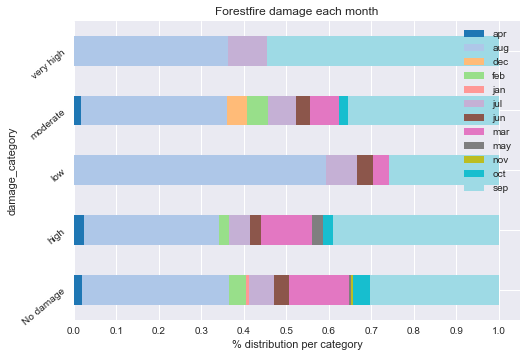

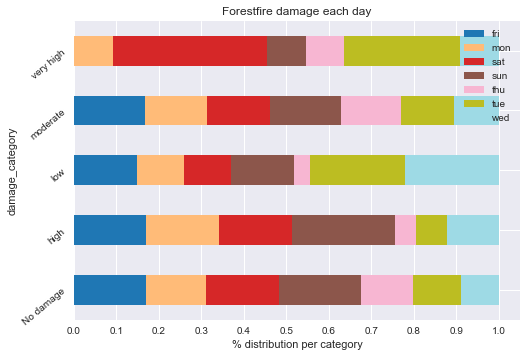

In [13]:
for col in categorical:
    cross = pd.crosstab(index=df_ff['damage_category'],columns=df_ff[col],normalize='index')
    cross.plot.barh(stacked=True,rot=40,cmap='tab20')
    plt.xlabel('% distribution per category')
    plt.xticks(np.arange(0,1.1,0.1))
    plt.title("Forestfire damage each {}".format(col))
    plt.legend(loc='upper right')

plt.show()

Based on the plot above, it seems that forest fires happen often during August and September.
This makes sense because the summer season falls on August and September.
It seems like forest fires can happen at any day of the week.

Next, let's categorize the target/area into two classes: no damage (0) and possible damage (1).

In [14]:
df_ff['target'] = df_ff['damage_category'].replace(['No damage','low','moderate','high','very high'],[0,1,1,1,1])
df_ff = df_ff.drop(['damage_category','area'],axis=1)

Previously, we mentioned that there's an imbalance in the data because area is highly skewed. We decided to use the oversampling method to fix this issue.

Random over-sampling:
1    270
0    247
Name: target, dtype: int64


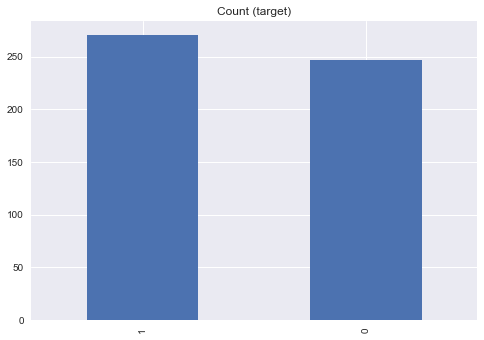

In [15]:
#Over-resampling
count_class_0, count_class_1 = df_ff.target.value_counts()

df_class_0 = df_ff[df_ff['target'] == 0]
df_class_1 = df_ff[df_ff['target'] == 1]

df_class_1_over = df_class_1.sample(count_class_0, replace=True)
df_ff = pd.concat([df_class_0, df_class_1_over], axis=0)

print('Random over-sampling:')
print(df_ff.target.value_counts())

df_ff.target.value_counts().plot(kind='bar', title='Count (target)');

### Data preparation

In [16]:
X = df_ff.drop(['DC','target'],axis=1)
y = df_ff['target']
print('Input', X.shape)
print('Output', y.shape)

Input (517, 11)
Output (517,)


In [17]:
# Encoding categorical data for independent variables 
labelencoder_X_1 = LabelEncoder()
# X[':, 2'] = labelencoder_X_1.fit_transform(X[:, 2]) #For month
X['month'] = labelencoder_X_1.fit_transform(X['month']) #For month

labelencoder_X_2 = LabelEncoder()
# X[:, 3] = labelencoder_X_2.fit_transform(X[:, 3]) #For weekday
X['day'] = labelencoder_X_2.fit_transform(X['day']) #For weekday

In [18]:
#categorical data
categorical_cols = ['month','day'] 

#import pandas as pd
X = pd.get_dummies(X, columns = categorical_cols)
X.head()

,X,Y,FFMC,DMC,ISI,temp,RH,wind,rain,month_0,...,month_9,month_10,month_11,day_0,day_1,day_2,day_3,day_4,day_5,day_6
0,7,5,86.2,26.2,5.1,8.2,51,6.7,0.0,0,...,0,0,0,1,0,0,0,0,0,0
1,7,4,90.6,35.4,6.7,18.0,33,0.9,0.0,0,...,0,1,0,0,0,0,0,0,1,0
2,7,4,90.6,43.7,6.7,14.6,33,1.3,0.0,0,...,0,1,0,0,0,1,0,0,0,0
3,8,6,91.7,33.3,9.0,8.3,97,4.0,0.2,0,...,0,0,0,1,0,0,0,0,0,0
4,8,6,89.3,51.3,9.6,11.4,99,1.8,0.0,0,...,0,0,0,0,0,0,1,0,0,0


Due to one-hot encoding, we now have 28 columns.

In [19]:
y = to_categorical(y)

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=12)

In [21]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

### Experiment 1&2: Epoch and Batch Size

We would like to know how epoch size and batch size affect the train and test accuracy.

In [22]:
def forest_fire_mod_1(X_train, y_train, X_test, y_test, n_batch, n_epoch):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=n_epoch, verbose=0, batch_size=n_batch)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('batch = '+str(n_batch))
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('Batch=%.3f, Epoch=%.3f showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (int(n_batch), int(n_epoch), train_acc, valid_acc))

Batch=1.000, Epoch=100.000 showed Train accuracy of: 0.872 and Test accuracy of: 0.635
Batch=1.000, Epoch=200.000 showed Train accuracy of: 0.906 and Test accuracy of: 0.606
Batch=1.000, Epoch=500.000 showed Train accuracy of: 0.952 and Test accuracy of: 0.692
Batch=1.000, Epoch=1000.000 showed Train accuracy of: 0.964 and Test accuracy of: 0.635
Batch=1.000, Epoch=2000.000 showed Train accuracy of: 0.990 and Test accuracy of: 0.663


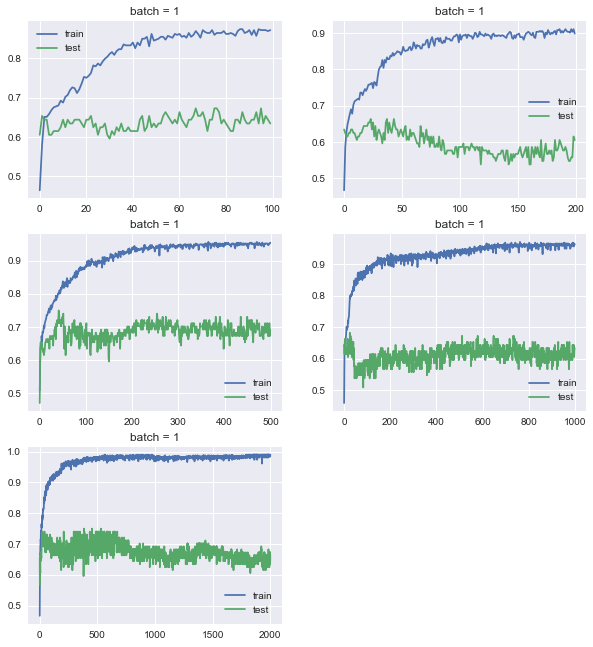

In [23]:
batch_sizes = [1]
epoch_iter = [100,200,500,1000,2000]
plt.figure(figsize=(10, 15))

for i in range(len(epoch_iter)):
    
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    
    # fit model and plot learning curves for a batch size
    forest_fire_mod_1(X_train, y_train, X_test, y_test, batch_sizes[0],epoch_iter[i])
  
plt.show()

The higher the epoch, the more accurate the results. However, the accuracy stops increasing significantly after epoch 1000.

However, this doesn't hide the fact that the data is still overfitting even at epoch 2000.

Batch=1.000, Epoch=800.000 showed Train accuracy of: 0.988 and Test accuracy of: 0.750
Batch=3.000, Epoch=800.000 showed Train accuracy of: 0.937 and Test accuracy of: 0.635
Batch=5.000, Epoch=800.000 showed Train accuracy of: 0.973 and Test accuracy of: 0.683
Batch=10.000, Epoch=800.000 showed Train accuracy of: 0.978 and Test accuracy of: 0.663


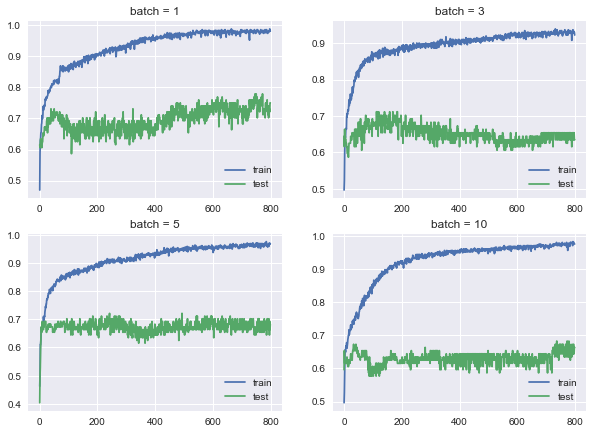

In [24]:
batch_sizes = [1,3,5,10]
epoch_iter = [800]
plt.figure(figsize=(10, 15))

for i in range(len(batch_sizes)):
    
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    
    # fit model and plot learning curves for a batch size
    forest_fire_mod_1(X_train, y_train, X_test, y_test, batch_sizes[i],epoch_iter[0])
  
plt.show()

The lower the batch size, the higher the accuracy. Having said that, the accuracy didn't increase significantly when we decrease the batch size from 10 to 5. The data is also still overfitting.

### Experiment 3: Output Activation Function

In [25]:
def forest_fire_mod_2(X_train, y_train, X_test, y_test, act_func_2):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation=act_func_2, kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=1)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('activation function='+act_func_2)
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('Activation Function ' + act_func_2 + ' showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

Activation Function relu showed Train accuracy of: 0.964 and Test accuracy of: 0.683
Activation Function softmax showed Train accuracy of: 0.831 and Test accuracy of: 0.663
Activation Function sigmoid showed Train accuracy of: 0.983 and Test accuracy of: 0.654
Activation Function tanh showed Train accuracy of: 0.988 and Test accuracy of: 0.635
Activation Function softplus showed Train accuracy of: 0.990 and Test accuracy of: 0.712


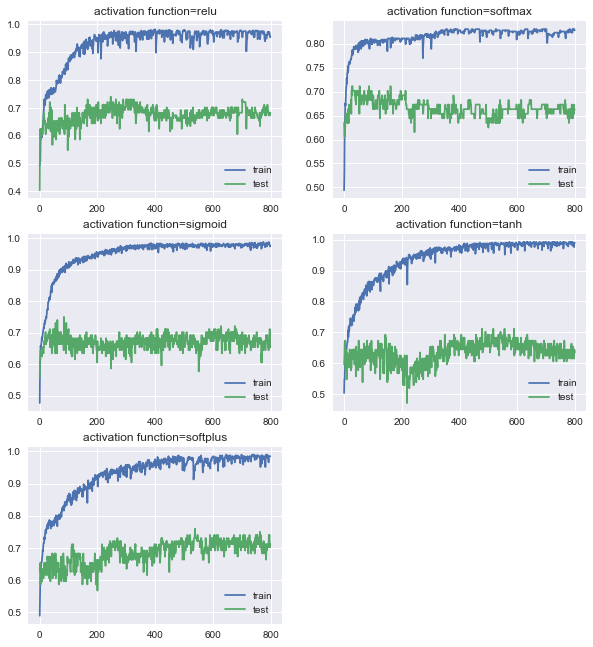

In [26]:
act_func_2 = ['relu','softmax','sigmoid','tanh','softplus']
plt.figure(figsize=(10, 15))

for i in range(len(act_func_2)):
    
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    
    # fit model and plot learning curves for a batch size
    forest_fire_mod_2(X_train, y_train, X_test, y_test, act_func_2[i])
  
plt.show()

Softplus has the highest train and test accuracy but softmax is the least overfitting.

### Experiment 4: Loss Function

In [27]:
def forest_fire_mod_3(X_train, y_train, X_test, y_test, loss_func):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss=loss_func, optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=5)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('loss function='+loss_func)
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('Loss Function ' + loss_func + ' showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

Loss Function binary_crossentropy showed Train accuracy of: 0.978 and Test accuracy of: 0.702
Loss Function categorical_crossentropy showed Train accuracy of: 0.959 and Test accuracy of: 0.683


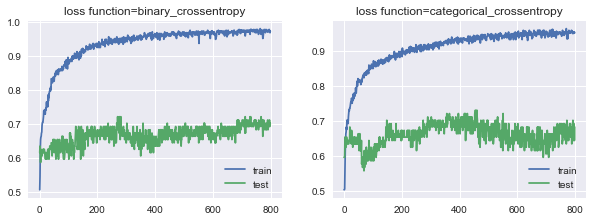

In [28]:
loss_func = ['binary_crossentropy','categorical_crossentropy']
plt.figure(figsize=(10, 15))

for i in range(len(loss_func)):
    
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    
    # fit model and plot learning curves for a batch size
    forest_fire_mod_3(X_train, y_train, X_test, y_test, loss_func[i])
  
plt.show()

Binary crossentropy yields better result and is less overfitting. Looking at the data (0 or 1) it also seems like binary crossentropy is more suitable.

### Experiment 5: Optimizer

In [29]:
def forest_fire_mod_4(X_train, y_train, X_test, y_test, opt):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=5)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('optimizer='+opt)
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('Loss Function ' + opt + ' showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

Loss Function adam showed Train accuracy of: 0.956 and Test accuracy of: 0.683
Loss Function adamax showed Train accuracy of: 0.910 and Test accuracy of: 0.644
Loss Function sgd showed Train accuracy of: 0.964 and Test accuracy of: 0.712
Loss Function rmsprop showed Train accuracy of: 0.973 and Test accuracy of: 0.683


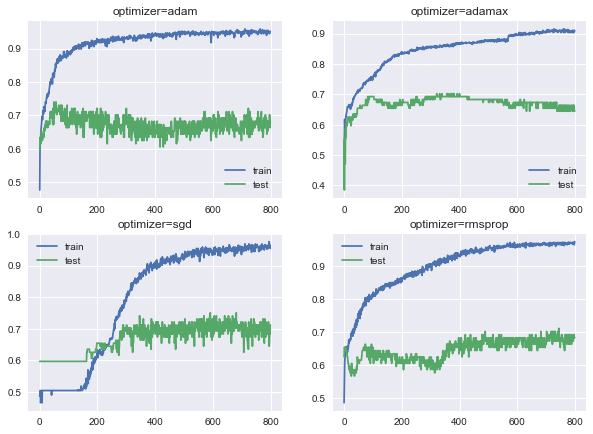

In [30]:
opt = ['adam','adamax','sgd','rmsprop']
plt.figure(figsize=(10, 15))

for i in range(len(opt)):
    
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    
    # fit model and plot learning curves for a batch size
    forest_fire_mod_4(X_train, y_train, X_test, y_test, opt[i])
  
plt.show()

SGD has the highest accuracy but let's use Adam as it can automatically adapt with learning rate.

### Experiment 6: Number of Layers

3 layers

In [31]:
def forest_fire_mod_5(X_train, y_train, X_test, y_test):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=5)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('3 layers')
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('This model showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

This model showed Train accuracy of: 0.973 and Test accuracy of: 0.721


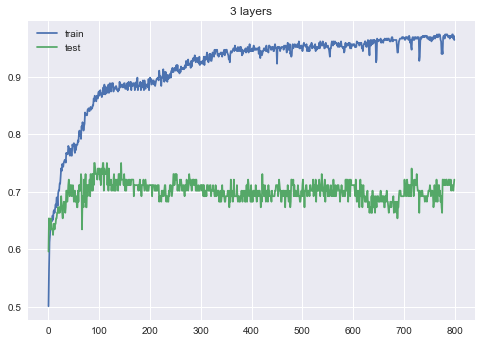

In [32]:
forest_fire_mod_5(X_train, y_train, X_test, y_test)
  
plt.show()

4 layers

In [33]:
def forest_fire_mod_6(X_train, y_train, X_test, y_test):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=5)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('4 layers')
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('This model showed Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

This model showed Train accuracy of: 0.981 and Test accuracy of: 0.673


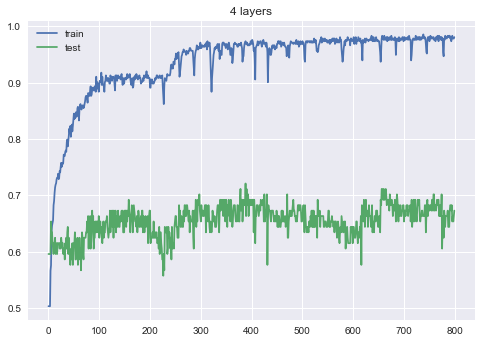

In [34]:
forest_fire_mod_6(X_train, y_train, X_test, y_test)
  
plt.show()

5 layers

In [35]:
def forest_fire_mod_7(X_train, y_train, X_test, y_test):
    model = Sequential(name='forest_fire_mod')
    model.add(Dense(10, input_dim=28, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(10, activation='relu', kernel_initializer='uniform'))
    model.add(Dense(2, activation='softmax', kernel_initializer='uniform'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    classifier = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=800, verbose=0, batch_size=5)
    
    plt.plot(classifier.history['accuracy'], label='train')
    plt.plot(classifier.history['val_accuracy'], label='test')
    plt.title('5 layers')
    plt.legend()
      
    # evaluate the model
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, valid_acc = model.evaluate(X_test, y_test, verbose=0)
    print('This model has Train accuracy of: %.3f and Test accuracy of: %.3f' % (train_acc, valid_acc))

This model has Train accuracy of: 0.782 and Test accuracy of: 0.712


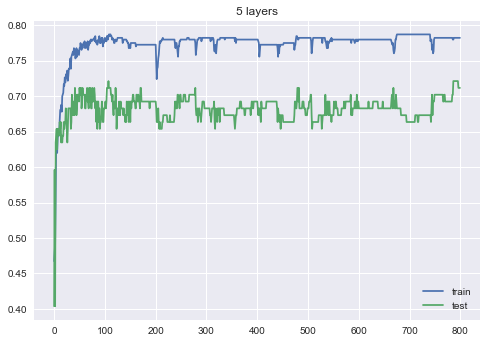

In [36]:
forest_fire_mod_7(X_train, y_train, X_test, y_test)
  
plt.show()

We'll be using 3 layers as it yields higher accuracy for both training and test.
5 layers yield less overfitted result, but the graph looks a little weird.

### Final Model and Accuracy

Based on the experiments conducted above, we have decided on the final hyperparameters which will be used for the final model.

------------------------------------------

Epoch = doesn't really matter

Batch size = 5

Output activation function = softmax

Loss = binary crossentropy

Optimizer = rmsprop

Number of layers = 4

--------------------

Train: 0.971, Valid: 0.663


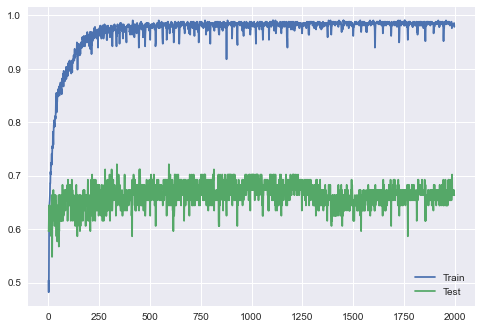

In [39]:
classifier = Sequential()

classifier.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu', input_dim = 28))
classifier.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
classifier.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
classifier.add(Dense(2, kernel_initializer = 'uniform', activation = 'softmax'))

classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

history = classifier.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size = 5, epochs = 2000, verbose = 0)

_, train_acc = classifier.evaluate(X_train, y_train, verbose=0)
_, valid_acc = classifier.evaluate(X_test, y_test, verbose=0)
print('Train: %.3f, Valid: %.3f' % (train_acc, valid_acc))

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Test')
plt.legend()
plt.show()

## Performance Improvement

Dropout

Train: 0.927, Test: 0.760


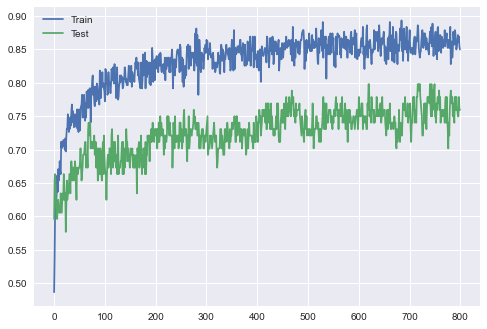

In [40]:
classifier2 = Sequential(name='mod_with_dropout')

classifier2.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu', input_dim = 28))
classifier2.add(Dropout(rate=0.2))

classifier2.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
classifier2.add(Dropout(rate=0.2))

classifier2.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
classifier2.add(Dropout(rate=0.2))

classifier2.add(Dense(2, kernel_initializer = 'uniform', activation = 'softmax'))

classifier2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

history2 = classifier2.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size = 1, epochs = 800, verbose = 0)

_, train_acc = classifier2.evaluate(X_train, y_train, verbose=0)
_, valid_acc = classifier2.evaluate(X_test, y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, valid_acc))

plt.plot(history2.history['accuracy'], label='Train')
plt.plot(history2.history['val_accuracy'], label='Test')
plt.legend()
plt.show()

Using dropout decreases overfitting, but decreases the training accuracy.

Early Stopping with Model Checkpoint

In [41]:
def init_model():

    model = Sequential(name='mod_with_dropout')
    model.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu', input_dim = 28))
    model.add(Dropout(rate=0.3))
    model.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
    model.add(Dropout(rate=0.3))
    model.add(Dense(10, kernel_initializer = 'uniform', activation = 'relu'))
    model.add(Dropout(rate=0.3))
    model.add(Dense(2, kernel_initializer = 'uniform', activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    
    return model

In [42]:
model_fin = init_model()

In [43]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=2000)

In [44]:
mc = ModelCheckpoint('best_model', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [45]:
history_fin = model_fin.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=1, epochs=800, verbose=0, callbacks=[es, mc])


Epoch 00001: val_accuracy improved from -inf to 0.59615, saving model to best_model

Epoch 00002: val_accuracy did not improve from 0.59615

Epoch 00003: val_accuracy did not improve from 0.59615

Epoch 00004: val_accuracy did not improve from 0.59615

Epoch 00005: val_accuracy improved from 0.59615 to 0.67308, saving model to best_model

Epoch 00006: val_accuracy did not improve from 0.67308

Epoch 00007: val_accuracy did not improve from 0.67308

Epoch 00008: val_accuracy did not improve from 0.67308

Epoch 00009: val_accuracy did not improve from 0.67308

Epoch 00010: val_accuracy did not improve from 0.67308

Epoch 00011: val_accuracy did not improve from 0.67308

Epoch 00012: val_accuracy did not improve from 0.67308

Epoch 00013: val_accuracy did not improve from 0.67308

Epoch 00014: val_accuracy did not improve from 0.67308

Epoch 00015: val_accuracy did not improve from 0.67308

Epoch 00016: val_accuracy did not improve from 0.67308

Epoch 00017: val_accuracy did not improve 


Epoch 00146: val_accuracy did not improve from 0.69231

Epoch 00147: val_accuracy did not improve from 0.69231

Epoch 00148: val_accuracy did not improve from 0.69231

Epoch 00149: val_accuracy did not improve from 0.69231

Epoch 00150: val_accuracy did not improve from 0.69231

Epoch 00151: val_accuracy did not improve from 0.69231

Epoch 00152: val_accuracy did not improve from 0.69231

Epoch 00153: val_accuracy did not improve from 0.69231

Epoch 00154: val_accuracy did not improve from 0.69231

Epoch 00155: val_accuracy did not improve from 0.69231

Epoch 00156: val_accuracy did not improve from 0.69231

Epoch 00157: val_accuracy did not improve from 0.69231

Epoch 00158: val_accuracy did not improve from 0.69231

Epoch 00159: val_accuracy did not improve from 0.69231

Epoch 00160: val_accuracy did not improve from 0.69231

Epoch 00161: val_accuracy did not improve from 0.69231

Epoch 00162: val_accuracy did not improve from 0.69231

Epoch 00163: val_accuracy did not improve from 


Epoch 00293: val_accuracy did not improve from 0.69231

Epoch 00294: val_accuracy did not improve from 0.69231

Epoch 00295: val_accuracy did not improve from 0.69231

Epoch 00296: val_accuracy did not improve from 0.69231

Epoch 00297: val_accuracy improved from 0.69231 to 0.70192, saving model to best_model

Epoch 00298: val_accuracy did not improve from 0.70192

Epoch 00299: val_accuracy did not improve from 0.70192

Epoch 00300: val_accuracy did not improve from 0.70192

Epoch 00301: val_accuracy did not improve from 0.70192

Epoch 00302: val_accuracy did not improve from 0.70192

Epoch 00303: val_accuracy did not improve from 0.70192

Epoch 00304: val_accuracy did not improve from 0.70192

Epoch 00305: val_accuracy did not improve from 0.70192

Epoch 00306: val_accuracy did not improve from 0.70192

Epoch 00307: val_accuracy did not improve from 0.70192

Epoch 00308: val_accuracy did not improve from 0.70192

Epoch 00309: val_accuracy did not improve from 0.70192

Epoch 00310: va


Epoch 00436: val_accuracy did not improve from 0.75962

Epoch 00437: val_accuracy did not improve from 0.75962

Epoch 00438: val_accuracy did not improve from 0.75962

Epoch 00439: val_accuracy did not improve from 0.75962

Epoch 00440: val_accuracy did not improve from 0.75962

Epoch 00441: val_accuracy did not improve from 0.75962

Epoch 00442: val_accuracy did not improve from 0.75962

Epoch 00443: val_accuracy did not improve from 0.75962

Epoch 00444: val_accuracy did not improve from 0.75962

Epoch 00445: val_accuracy did not improve from 0.75962

Epoch 00446: val_accuracy did not improve from 0.75962

Epoch 00447: val_accuracy did not improve from 0.75962

Epoch 00448: val_accuracy did not improve from 0.75962

Epoch 00449: val_accuracy did not improve from 0.75962

Epoch 00450: val_accuracy did not improve from 0.75962

Epoch 00451: val_accuracy did not improve from 0.75962

Epoch 00452: val_accuracy did not improve from 0.75962

Epoch 00453: val_accuracy did not improve from 


Epoch 00583: val_accuracy did not improve from 0.75962

Epoch 00584: val_accuracy did not improve from 0.75962

Epoch 00585: val_accuracy did not improve from 0.75962

Epoch 00586: val_accuracy did not improve from 0.75962

Epoch 00587: val_accuracy did not improve from 0.75962

Epoch 00588: val_accuracy did not improve from 0.75962

Epoch 00589: val_accuracy did not improve from 0.75962

Epoch 00590: val_accuracy did not improve from 0.75962

Epoch 00591: val_accuracy did not improve from 0.75962

Epoch 00592: val_accuracy did not improve from 0.75962

Epoch 00593: val_accuracy did not improve from 0.75962

Epoch 00594: val_accuracy did not improve from 0.75962

Epoch 00595: val_accuracy did not improve from 0.75962

Epoch 00596: val_accuracy did not improve from 0.75962

Epoch 00597: val_accuracy did not improve from 0.75962

Epoch 00598: val_accuracy did not improve from 0.75962

Epoch 00599: val_accuracy did not improve from 0.75962

Epoch 00600: val_accuracy did not improve from 


Epoch 00730: val_accuracy did not improve from 0.75962

Epoch 00731: val_accuracy did not improve from 0.75962

Epoch 00732: val_accuracy did not improve from 0.75962

Epoch 00733: val_accuracy did not improve from 0.75962

Epoch 00734: val_accuracy did not improve from 0.75962

Epoch 00735: val_accuracy did not improve from 0.75962

Epoch 00736: val_accuracy did not improve from 0.75962

Epoch 00737: val_accuracy did not improve from 0.75962

Epoch 00738: val_accuracy did not improve from 0.75962

Epoch 00739: val_accuracy did not improve from 0.75962

Epoch 00740: val_accuracy did not improve from 0.75962

Epoch 00741: val_accuracy did not improve from 0.75962

Epoch 00742: val_accuracy did not improve from 0.75962

Epoch 00743: val_accuracy did not improve from 0.75962

Epoch 00744: val_accuracy did not improve from 0.75962

Epoch 00745: val_accuracy did not improve from 0.75962

Epoch 00746: val_accuracy did not improve from 0.75962

Epoch 00747: val_accuracy did not improve from 

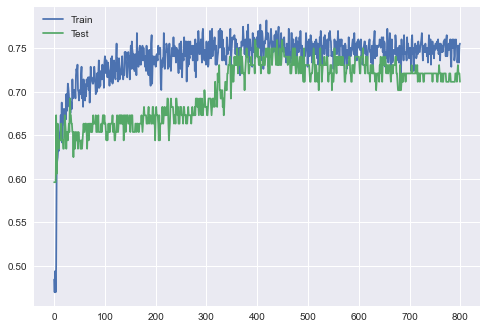

In [46]:
# plot training history
plt.plot(history_fin.history['accuracy'], label='Train')
plt.plot(history_fin.history['val_accuracy'], label='Test')
plt.legend()
plt.show()

In [47]:
_, train_acc = model_fin.evaluate(X_train, y_train, verbose=0)
_, valid_acc = model_fin.evaluate(X_test, y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, valid_acc))

Train: 0.799, Test: 0.712


## Conclusion

1. EDA is important as it gives us more information on the data we're going to train - missing/null values, imbalance, etc.
2. Data preparation such as label and one-hot encoding is also important to make sure that the neural network understands the input.
3. Epoch size may or may not matter; it really depends on your data. Increasing epoch size may not reduce issues such as overfitting.
4. The lower the batch size, the higher the accuracy. Based on the experiment conducted in this notebook, accuracy doesn't increase significantly especially if your batch size is already small to begin with (i.e. 10 or 5).
5. Other hyperparameters such as activation function, loss function, optimizer are very important. One note is that the function you choose should also fit your data.
6. Number of layers doesn't guarantee higher accuracy too.
7. Dropout and callbacks help reduce overfitting. However, accuracy drops after adding dropout and callbacks.